Loaded: MTAD_GAT (Shifted by 100 steps)
Loaded: Proposed (Shifted by 0 steps)
Loaded: TimesNet (Shifted by 0 steps)
Plotting start... (Multi-Model Comparison)
Rendering...


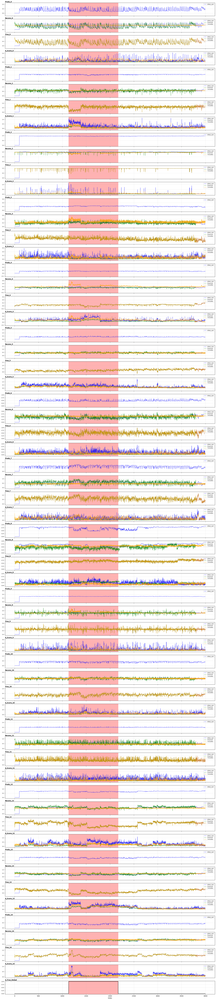

Done.


In [6]:
import os
import sys
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- 여기에 추가 ---
class CompatibilityUnpickler(pickle.Unpickler):
    def find_class(self, module, name):
        if module.startswith('numpy._core'):
            module = module.replace('numpy._core', 'numpy.core')
        return super().find_class(module, name)
# ------------------


# [해킹] NumPy 2.0 -> 1.x 호환성을 위한 강력한 경로 매핑
# NumPy 1.x 환경에서 2.0 데이터를 부를 때 필요한 매핑
if 'numpy._core' not in sys.modules:
    import numpy.core as core
    sys.modules['numpy._core'] = core
    sys.modules['numpy._core.numeric'] = core.numeric
    sys.modules['numpy._core.multiarray'] = core.multiarray
    sys.modules['numpy._core.umath'] = core.umath
    sys.modules['numpy._core.defs'] = core.defchararray # 필요 시 추가
# ---------------------------------------------------------
# 1. 여러 모델의 결과 경로 및 패딩 지정 (딕셔너리 형태)
# ---------------------------------------------------------
# 구조: "모델명": (r'폴더경로', 앞부분_추가할_패딩_개수)
model_paths = {
    "MTAD_GAT" : (r'output\COLLECTOR\MTAD_GAT\backup\29032026_232607', 100),
    # "LSTM_AE": (r'output\COLLECTOR\LSTM_AE\04052026_021132', 0),
    # "TranAD": (r'output\COLLECTOR\TranAD\backup\29032026_235534', 0),
    "Proposed": (r'output\COLLECTOR\Proposed_v6\backup\win200\n_heads_gat=2\base\22042026_010540', 0),
    # "MTAD_GAT" : (r'output\SMD\MTAD_GAT\backup\machine-1-7\01042026_002719', 100),
    # "GDN": (r'output\SMD\GDN\backup\machine-1-7\25042026_205137', 5),
    "TimesNet" : (r'output\COLLECTOR\USAD\06052026_130757', 0)
    # "Proposed": (r'output\SMD\Proposed_v6\backup\base\machine-1-7\23042026_115721', 0)
}

# 데이터 로드 및 패딩 처리
model_data = {}
for model_name, (dir_path, pad_size) in model_paths.items():
    file_path = os.path.join(dir_path, 'test_output.pkl')
    
    # if os.path.exists(file_path):
    #     with open(file_path, "rb") as f:
    #         df = pickle.load(f)
    # 수정 후
    if os.path.exists(file_path):
        with open(file_path, "rb") as f:
        # 커스텀 언피클러를 사용하여 데이터를 읽어옵니다.
            df = CompatibilityUnpickler(f).load()    
            
        # [핵심 로직] 지정된 패딩 개수가 0보다 크면 앞에 데이터 추가
        if pad_size > 0:
            # 1. 0으로 채워진 빈 DataFrame 생성 (길이: pad_size, 컬럼: 기존 df와 동일)
            # 팁: 0 대신 np.nan을 넣으면 그래프에서 0으로 뚝 떨어지는 선 없이 아예 투명하게 비워둘 수 있습니다.
            pad_df = pd.DataFrame(0, index=np.arange(pad_size), columns=df.columns)
            
            # 2. 패딩 데이터와 기존 데이터를 위아래로 결합 (ignore_index=True로 인덱스 재정렬)
            df = pd.concat([pad_df, df], ignore_index=True)
            
        model_data[model_name] = df
        print(f"Loaded: {model_name} (Shifted by {pad_size} steps)")
    else:
        print(f"File not found, skipping: {file_path}")

# 모델이 없으면 종료
if not model_data:
    print("로드된 모델 데이터가 없습니다. 경로를 확인해주세요.")
    sys.exit()

# ---------------------------------------------------------
# [Helper Function] 연속된 구간 찾기
# ---------------------------------------------------------
def get_continuous_ranges(indices):
    if len(indices) == 0: return []
    diffs = np.diff(indices)
    breaks = np.where(diffs > 1)[0] + 1
    groups = np.split(indices, breaks)
    ranges = []
    for group in groups:
        if len(group) > 0:
            ranges.append((group[0], group[-1]))
    return ranges

# ---------------------------------------------------------
# 2. 공통 기준 정보 추출 (라벨, 컬럼 목록)
# ---------------------------------------------------------
# 첫 번째 모델을 기준으로 컬럼과 라벨을 가져옵니다. (모든 모델의 데이터 구조가 같다고 가정)
base_model_name = list(model_data.keys())[0]
base_df = model_data[base_model_name]

# 라벨 데이터 추출 및 이상 구간 계산 (모든 모델이 동일하므로 한 번만 수행)
labels = base_df['A_True_Global'] if 'A_True_Global' in base_df.columns else None
anomaly_ranges, single_points = [], []

if labels is not None:
    anomaly_indices = labels[labels == 1].index.values
    temp_ranges = get_continuous_ranges(anomaly_indices)
    for start, end in temp_ranges:
        if start == end:
            single_points.append(start)
        else:
            anomaly_ranges.append((start, end))

# 그릴 컬럼 필터링
cols = [c for c in base_df.columns if not (c.startswith('Thresh_') or c.startswith('A_Pred_') or c == 'A_Score_Global')]
if 'A_True_Global' in cols:
    cols.remove('A_True_Global')
    cols.append('A_True_Global') # 항상 맨 아래에 그려지도록 끝으로 이동

num_cols = len(cols)

# ---------------------------------------------------------
# 3. 모든 모델을 포괄하는 Y축 범위 동기화 (Global Y-Limit Sync)
# ---------------------------------------------------------
ylim_map = {}
for col in cols:
    if '_' in col and col.split('_')[-1].isdigit():
        var_id = col.split('_')[-1]
        
        global_min, global_max = float('inf'), float('-inf')
        
        # 모든 모델을 순회하며 해당 컬럼의 최대/최소값을 찾음
        for df in model_data.values():
            if col in df.columns:
                global_min = min(global_min, df[col].min())
                global_max = max(global_max, df[col].max())
        
        if global_min != float('inf'):
            if var_id not in ylim_map:
                ylim_map[var_id] = [global_min, global_max]
            else:
                ylim_map[var_id][0] = min(ylim_map[var_id][0], global_min)
                ylim_map[var_id][1] = max(ylim_map[var_id][1], global_max)

# ---------------------------------------------------------
# 4. 다중 모델 시각화 오버레이 (Overlay Plotting)
# ---------------------------------------------------------
print("Plotting start... (Multi-Model Comparison)")

fig, axes = plt.subplots(nrows=num_cols, ncols=1, figsize=(20, num_cols * 1.5), sharex=True)
fig.tight_layout(pad=1.0)

# 겹쳐 그릴 때 모델들을 구분하기 위한 색상 리스트
model_colors = ['blue', 'green', 'orange', 'purple', 'cyan', 'brown'] 

for i, col in enumerate(cols):
    ax = axes[i] if num_cols > 1 else axes
    
    # 1. 각 모델별로 데이터를 겹쳐서(Overlay) 그리기
    for idx, (model_name, df) in enumerate(model_data.items()):
        if col not in df.columns: 
            continue
            
        # A_True_Global은 모든 모델이 동일하므로 검은색으로 한 번만 그리기
        if 'A_True_Global' in col:
            if idx == 0: 
                ax.plot(df.index, df[col], color='black', linewidth=1.5, zorder=2, label='True Label', rasterized=True)
        else:
            # Recons, A_score 등은 모델별 색상 할당
            color = model_colors[idx % len(model_colors)]
            ax.plot(df.index, df[col], color=color, linewidth=1, alpha=0.8, zorder=2, label=model_name, rasterized=True)
    
    # 2. 동기화된 Y축 범위 적용
    if '_' in col and col.split('_')[-1].isdigit():
        var_id = col.split('_')[-1]
        if var_id in ylim_map:
            y_min, y_max = ylim_map[var_id]
            padding = (y_max - y_min) * 0.1 if (y_max - y_min) > 0 else 0.1
            ax.set_ylim(y_min - padding, y_max + padding)

    # 3. 이상치 구간 병합 및 단일 점 그리기 (공통)
    for start, end in anomaly_ranges:
        ax.axvspan(start, end, color='red', alpha=0.3, zorder=1, rasterized=True)
    for pt in single_points:
        ax.vlines(x=pt, ymin=0, ymax=1, colors='red', transform=ax.get_xaxis_transform(), alpha=0.5, linewidth=2, zorder=1, rasterized=True)

    # 4. 차트 꾸미기
    ax.set_title(col, fontsize=10, pad=3, loc='left', fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.tick_params(axis='y', labelsize=8)
    
    # 범례(Legend) 표시 (그래프가 지저분해지지 않게 우측 상단에 배치)
    # A_True_Global 에는 모델 라벨을 달지 않으므로 분기 처리
    if 'A_True_Global' not in col:
        ax.legend(loc='upper right', fontsize=8)

plt.xlabel("Index")

print("Rendering...")
plt.show()
print("Done.")

In [7]:
import os
import sys
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# [해킹] NumPy 2.0 -> 1.x 호환성을 위한 강력한 경로 매핑
# ---------------------------------------------------------
class CompatibilityUnpickler(pickle.Unpickler):
    def find_class(self, module, name):
        if module.startswith('numpy._core'):
            module = module.replace('numpy._core', 'numpy.core')
        return super().find_class(module, name)

if 'numpy._core' not in sys.modules:
    import numpy.core as core
    sys.modules['numpy._core'] = core
    sys.modules['numpy._core.numeric'] = core.numeric
    sys.modules['numpy._core.multiarray'] = core.multiarray
    sys.modules['numpy._core.umath'] = core.umath
    sys.modules['numpy._core.defs'] = core.defchararray

# ---------------------------------------------------------
# [Helper Function] 연속된 구간 찾기
# ---------------------------------------------------------
def get_continuous_ranges(indices):
    if len(indices) == 0: return []
    diffs = np.diff(indices)
    breaks = np.where(diffs > 1)[0] + 1
    groups = np.split(indices, breaks)
    ranges = []
    for group in groups:
        if len(group) > 0:
            ranges.append((group[0], group[-1]))
    return ranges

# ---------------------------------------------------------
# [Main Function] 다중 모델 결과 시각화 함수
# ---------------------------------------------------------
def plot_multi_model_results(model_paths, time_range=None):
    """
    여러 모델의 이상치 탐지 결과를 로드하여 오버레이 그래프를 그리는 함수
    
    Args:
        model_paths (dict): {"모델명": (r'폴더경로', 패딩크기)} 형태의 딕셔너리
        time_range (list or tuple): [start_idx, end_idx] 형태의 리스트. None일 경우 전체 데이터 시각화.
    """
    
    # 1. 데이터 로드 및 패딩 처리
    model_data = {}
    for model_name, (dir_path, pad_size) in model_paths.items():
        file_path = os.path.join(dir_path, 'test_output.pkl')
        
        if os.path.exists(file_path):
            with open(file_path, "rb") as f:
                df = CompatibilityUnpickler(f).load()    
                
            # 지정된 패딩 개수가 0보다 크면 앞에 데이터 추가
            if pad_size > 0:
                pad_df = pd.DataFrame(0, index=np.arange(pad_size), columns=df.columns)
                df = pd.concat([pad_df, df], ignore_index=True)
                
            model_data[model_name] = df
            print(f"Loaded: {model_name} (Shifted by {pad_size} steps)")
        else:
            print(f"File not found, skipping: {file_path}")

    # 모델이 없으면 함수 종료
    if not model_data:
        print("로드된 모델 데이터가 없습니다. 경로를 확인해주세요.")
        return

    # 1.5 특정 구간(Time Range) 필터링
    if time_range is not None:
        start_idx, end_idx = time_range
        for model_name in model_data:
            # 지정된 인덱스 구간으로 DataFrame 슬라이싱
            model_data[model_name] = model_data[model_name].iloc[start_idx:end_idx]
        print(f"Data sliced to range: {start_idx} ~ {end_idx}")

    # 2. 공통 기준 정보 추출 (라벨, 컬럼 목록)
    base_model_name = list(model_data.keys())[0]
    base_df = model_data[base_model_name]

    # 라벨 데이터 추출 및 이상 구간 계산
    labels = base_df['A_True_Global'] if 'A_True_Global' in base_df.columns else None
    anomaly_ranges, single_points = [], []

    if labels is not None:
        anomaly_indices = labels[labels == 1].index.values
        temp_ranges = get_continuous_ranges(anomaly_indices)
        for start, end in temp_ranges:
            if start == end:
                single_points.append(start)
            else:
                anomaly_ranges.append((start, end))

    # 그릴 컬럼 필터링
    cols = [c for c in base_df.columns if not (c.startswith('Thresh_') or c.startswith('A_Pred_') or c == 'A_Score_Global')]
    if 'A_True_Global' in cols:
        cols.remove('A_True_Global')
        cols.append('A_True_Global') # 항상 맨 아래에 그려지도록 끝으로 이동

    num_cols = len(cols)

    # 3. 모든 모델을 포괄하는 Y축 범위 동기화 (Global Y-Limit Sync)
    ylim_map = {}
    for col in cols:
        if '_' in col and col.split('_')[-1].isdigit():
            var_id = col.split('_')[-1]
            global_min, global_max = float('inf'), float('-inf')
            
            for df in model_data.values():
                if col in df.columns:
                    global_min = min(global_min, df[col].min())
                    global_max = max(global_max, df[col].max())
            
            if global_min != float('inf'):
                if var_id not in ylim_map:
                    ylim_map[var_id] = [global_min, global_max]
                else:
                    ylim_map[var_id][0] = min(ylim_map[var_id][0], global_min)
                    ylim_map[var_id][1] = max(ylim_map[var_id][1], global_max)

    # 4. 다중 모델 시각화 오버레이 (Overlay Plotting)
    print("Plotting start... (Multi-Model Comparison)")

    fig, axes = plt.subplots(nrows=num_cols, ncols=1, figsize=(20, num_cols * 1.5), sharex=True)
    fig.tight_layout(pad=1.0)

    model_colors = ['blue', 'green', 'orange', 'purple', 'cyan', 'brown'] 

    for i, col in enumerate(cols):
        ax = axes[i] if num_cols > 1 else axes
        
        for idx, (model_name, df) in enumerate(model_data.items()):
            if col not in df.columns: 
                continue
                
            if 'A_True_Global' in col:
                if idx == 0: 
                    ax.plot(df.index, df[col], color='black', linewidth=1.5, zorder=2, label='True Label', rasterized=True)
            else:
                color = model_colors[idx % len(model_colors)]
                ax.plot(df.index, df[col], color=color, linewidth=1, alpha=0.8, zorder=2, label=model_name, rasterized=True)
        
        if '_' in col and col.split('_')[-1].isdigit():
            var_id = col.split('_')[-1]
            if var_id in ylim_map:
                y_min, y_max = ylim_map[var_id]
                padding = (y_max - y_min) * 0.1 if (y_max - y_min) > 0 else 0.1
                ax.set_ylim(y_min - padding, y_max + padding)

        for start, end in anomaly_ranges:
            ax.axvspan(start, end, color='red', alpha=0.3, zorder=1, rasterized=True)
        for pt in single_points:
            ax.vlines(x=pt, ymin=0, ymax=1, colors='red', transform=ax.get_xaxis_transform(), alpha=0.5, linewidth=2, zorder=1, rasterized=True)

        ax.set_title(col, fontsize=10, pad=3, loc='left', fontweight='bold')
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='y', labelsize=8)
        
        if 'A_True_Global' not in col:
            ax.legend(loc='upper right', fontsize=8)

    plt.xlabel("Index")

    print("Rendering...")
    plt.show()
    print("Done.")

Loaded: MTAD_GAT (Shifted by 100 steps)
Loaded: Proposed (Shifted by 0 steps)
Loaded: TimesNet (Shifted by 0 steps)
Data sliced to range: 0 ~ 1125
Plotting start... (Multi-Model Comparison)
Rendering...


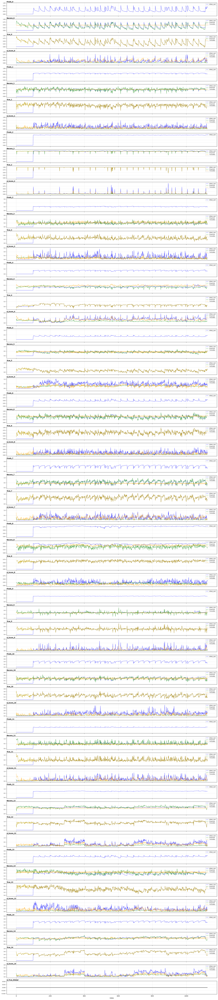

Done.


In [ ]:
# =========================================================
# 함수 실행 예시
# =========================================================
if __name__ == "__main__":
    my_models = model_paths

    # 특정 구간 보고 싶을 때
    plot_multi_model_results(model_paths=my_models, time_range=[0, 1125])
    
    # 전체 데이터를 다 보고 싶을 때
    # plot_multi_model_results(model_paths=my_models, time_range=None)